# Υπολογιστική Γεωμετρία - Εργασία 2023-2024

# Υλοποίηση Β: Γεωμετρική Αναζήτηση
---

**Ιωάννης Πετράκης (1115201900155)**

**<u>1) Αλγόριθμος ορθογώνιας γεωμετρικής αναζήτησης με KD-Trees</u>**

Δημιουργούμε τη δομή του kd-δέντρου και υλοποιούμε τη συνάρτηση rangesearch που αναζητεί τα σημεία που βρίσκονται μέσα στο ορθογώνιο που έχουμε ορίσει. Η αναζήτηση δε θα επιστρέψει τα σημεία που βρίσκονται πάνω σε κάποια πλευρά του ορθογωνίου.

In [1]:
# Checks if a point is in an orthogonal rectangle
def point_in_rectangle(point, rectangle):
  bl = rectangle[0]
  tr = rectangle[1]
  if (point[0] > bl[0] and point[0] < tr[0] and point[1] > bl[1] and point[1] < tr[1]):
      return True
  else:
    return False

# KD-Trees
class kdTree():

  # Create KD-Tree
  def __init__(self, P, d = 0):

    n = len(P)
    m = n // 2
    P.sort(key = lambda x: x[d])
    self.point = P[m]
    self.d = d
    d = (d + 1) % len(P[0])
    self.left = self.right = None

    if m > 0:
      self.left = kdTree(P[:m], d)
    if n - (m + 1) > 0:
      self.right = kdTree(P[m+1:], d)

  # Search KD-Tree
  def rangesearch(self, rectangle):
    p = self.point

    if point_in_rectangle(p, rectangle):
      yield p

    min_v = rectangle[0][self.d]
    max_v = rectangle[1][self.d]
    split = p[self.d]

    if self.left is not None and split >= min_v:
      yield from self.left.rangesearch(rectangle)
    if self.right is not None and split <= max_v:
      yield from self.right.rangesearch(rectangle)

Η κατασκευή ενός kd-δέντρου με n σημεία χρειάζεται χρόνο O(nlogn). Ο αλγόριθμος είναι αναδρομικός και σε κάθε επίπεδο χωρίζει τα σημεία στη μέση.

Στην ορθγώνια αναζήτηση σημείων η πολυπλοκότητα αυξάνεται όσο περισσότερα είναι τα σημεία που βρίσκονται μέσα στο ορθογώνιο. Σε ένα average case επισκεπτόμαστε μόνο ένα μέρος των κόμβων του δέντρου, κατά μέσο όρο $\sqrt{n}$ κόμβοι. Οπότε η πολυπλοκότητα αναζήτησης είναι περίπου $O(\sqrt{n} + k)$.

**<u>Εφαρμογή B</u>**

**create_points:** Συνάρτηση δημιουργίας **n** σημείων, των οποίων οι συντεταγμένες είναι ακέραιοι αριθμοί με τετμημένη $MIN\leq x\leq MAX$ και τεταγμένη $MIN\leq y\leq MAX$ . Δεν υπάρχουν δύο ίδια σημεία (ίδια τετμημένη και ίδια τεταγμένη) στο σύνολο σημείων που επιστρέφει η συνάρτηση.

In [2]:
import numpy as np
from numpy import random

def create_points(n, min_val, max_val):
  points = []

  for i in range(0, n):
    new_point = (random.randint(min_val, max_val), random.randint(min_val, max_val))
    if new_point not in points:
      points.append(new_point)
    else:
      i = i - 1

  return points

Δημιουργούμε ένα σύνολο P με 60 σημεία στο επίπεδο και μία ορθογώνια έκταση. Οι συντεταγμένες των σημείων είναι ακέραιοι αριθμοί με τετμημένη $MIN\leq x\leq MAX$ και τεταγμένη $MIN\leq y\leq MAX$ και δεν υπάρχουν δύο ίδια σημεία (ίδια τετμημένη και ίδια τεταγμένη) στο σύνολο P.



In [3]:
# Create points

n = 85 # number of points
min_val = 0
max_val = 100
P = create_points(n, min_val, max_val)

Ορίζουμε μία ορθογώνια έκταση με δύο σημεία: το κάτω αριστερά (οι ελάχιστες τιμές των x, y) και το πάνω δεξιά (οι μέγιστες τιμές των x, y).

Δημιουργούμε ένα kd-δέντρο και εισάγουμε τα σημεία του P σε αυτό.

Εφαρμόζουμε τον αλγόριθμο γεωμετρικής αναζήτησης με KD-Trees, δίνοντάς του ως όρισμα το kd-δέντρο και την ορθογώνια έκταση που ορίσαμε. Η αναζήτηση επιστρέφει τα σημεία του P που βρίσκονται εντός της ορθογώνιας έκτασης.

Εκτυπώνουμε σχήμα με τα σημεία και την ορθογώνια έκταση για να φανούν οπτικώς τα αποτελέσματα.

85 points:
[(90, 61), (56, 4), (99, 78), (27, 50), (25, 56), (58, 56), (95, 6), (81, 2), (53, 61), (86, 77), (78, 91), (7, 36), (74, 77), (37, 3), (67, 7), (26, 35), (6, 52), (40, 98), (21, 49), (19, 98), (17, 89), (68, 37), (22, 83), (40, 78), (76, 80), (27, 49), (97, 15), (65, 48), (50, 26), (30, 63), (69, 65), (81, 95), (69, 22), (58, 53), (15, 62), (51, 39), (14, 18), (22, 99), (3, 5), (5, 42), (77, 77), (99, 86), (32, 94), (41, 15), (38, 89), (39, 84), (62, 14), (44, 83), (52, 94), (49, 5), (37, 52), (7, 28), (77, 49), (64, 91), (94, 47), (19, 25), (85, 72), (71, 35), (65, 12), (41, 23), (36, 17), (54, 32), (0, 26), (37, 1), (94, 43), (62, 68), (61, 66), (33, 12), (98, 84), (47, 94), (39, 34), (13, 72), (57, 60), (55, 10), (10, 98), (9, 52), (0, 49), (38, 50), (14, 67), (47, 66), (73, 82), (29, 96), (17, 26), (8, 58), (36, 47)] 

Result: 27 points
[(38, 50), (26, 35), (21, 49), (36, 47), (27, 50), (27, 49), (39, 34), (37, 52), (30, 63), (25, 56), (40, 78), (57, 60), (65, 48), (58,

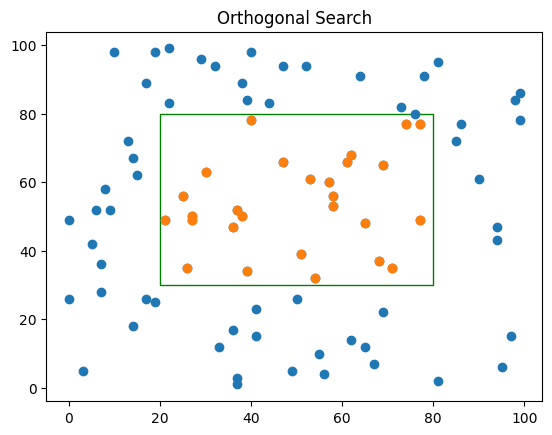

In [4]:
import matplotlib.pyplot as plt
import numpy as np

print(len(P), "points:")
print(P, "\n")

# Define rectangle
min_x = 20
max_x = 80
min_y = 30
max_y = 80
bottom_left = (min_x, min_y)
bottom_right = (max_x, max_y)
orthogonal_rectangle = [bottom_left, bottom_right]

# Create a kd-tree from P
tree = kdTree(P)

# Search
result = list(tree.rangesearch(orthogonal_rectangle))
print("Result:", len(result), "points")
print(result, "\n")

# Plot
points_array = np.array(P) # 2D Array with points
result_array = np.array(result)
plt.plot(points_array[:, 0], points_array[:, 1], 'o') # initial points
plt.plot(result_array[:, 0], result_array[:, 1], 'o') # points in rectangle
rectangle = plt.Rectangle(bottom_left, max_x-min_x, max_y-min_y, fc="white", ec="green") # rectangle
plt.gca().add_patch(rectangle)
plt.title("Orthogonal Search")
plt.show()

**<u>Εφαρμογή Γ: Τριγωνοποίηση Delaunay</u>**

Ορίζουμε ένα σύνολο P που αποτελείται από **n** σημεία στο επίπεδο. Οι συντεταγμένες των σημείων είναι ακέραιοι αριθμοί με τετμημένη $MIN\leq x\leq MAX$ και τεταγμένη $MIN\leq y\leq MAX$ και δεν υπάρχουν δύο ίδια σημεία (ίδια τετμημένη και ίδια τεταγμένη) στο σύνολο P.

In [32]:
# Create points for Delaunay Triangulation

n = 90 # points
min_val = 0
max_val = 100

points = create_points(n, min_val, max_val)
points_array = np.array(points) # 2D Array with points

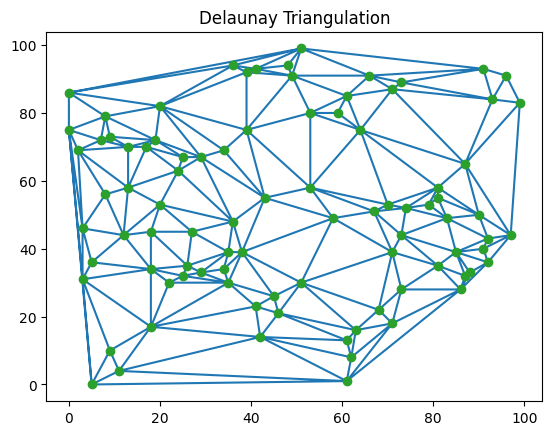

In [33]:
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay

tri = Delaunay(points_array)

# Delaunay Triangulation
plt.triplot(points_array[:, 0], points_array[:, 1], tri.simplices)
plt.plot(points_array[:, 0], points_array[:, 1], 'o')
plt.title("Delaunay Triangulation")
plt.show()

<u>Χρόνος τριγωνοποίησης Delaunay</u>: Ο αλγόριθμος δουλεύει επαναληπτικά προσθέτοντας κάθε σημείο στην τριγωνοποίηση κι ενημερώνοντας τη δομή της τριγωνοποίησης. Για n αρχικά σημεία ο χρόνος είναι $O(nlogn)$, άρα αυξάνεται όσο αυξάνονται τα σημεία. Για την υλοποίηση χρησιμοποιούμε τη κλάση Delaunay της βιβλιοθήκης της SciPy's spatial, η οποία συνήθως περιλαμβάνει έναν συνδυασμό αυξητικών αλγορίθμων, στρατηγικών διαίρει και βασίλευε, γεωμετρικών βελτιστοποιήσεων και αποτελεσματικών δομών δεδομένων προσαρμοσμένων στην τριγωνοποίηση Delaunay της βιβλιοθήκης Qhull.

**<u> Εφαρμογή Δ. Τριγωνοποίηση Delaunay σε εικόνες!</u>**

Αυτός ο κώδικας θα φορτώσει την εικόνα αστροναύτη χρησιμοποιώντας data.astronaut() από τη scikit-image, θα εφαρμόσει την τριγωνοποίηση Delaunay στην εικόνα χρησιμοποιώντας τη συνάρτηση apply_delaunay_triangulation και, στη συνέχεια, θα εμφανίσει την νέα εικόνα χρησιμοποιώντας τη μέθοδο Image.show() της βιβλιοθήκης PIL. Η προσαρμογή της παραμέτρου num_points καθορίζει την πολυπλοκότητα της εικόνας που προκύπτει.

In [1]:
import numpy as np
from scipy.spatial import Delaunay
from skimage import data
from PIL import Image, ImageDraw

# Function to apply Delaunay triangulation to the image
def apply_delaunay_triangulation(image, num_points):
    height, width = image.shape[:2]

    # Generate random points within image boundaries
    points = np.random.rand(num_points, 2) * np.array([width - 1, height - 1])

    # Compute Delaunay triangulation
    tri = Delaunay(points)

    # Create blank canvas
    new_image = Image.new('RGB', (width, height), color='white')
    draw = ImageDraw.Draw(new_image)

    # Iterate over each triangle in the triangulation
    for triangle_indices in tri.simplices:
        # Get the coordinates of the vertices of the triangle
        vertices = points[triangle_indices]

        # Calculate the color for the triangle as the average of the colors of its vertices
        color = tuple(np.mean(image[np.round(vertices[:, 1]).astype(int), np.round(vertices[:, 0]).astype(int)], axis=0).astype(int))

        # Fill the triangle with the calculated color
        draw.polygon([tuple(vertex) for vertex in vertices], fill=color)

    return new_image

# Load the astronaut image from scikit-image
astronaut_image = data.astronaut()

# Apply Delaunay triangulation to the astronaut image
num_points = 10000  # Adjust this value to control the complexity of the resulting image
triangulated_image = apply_delaunay_triangulation(astronaut_image, num_points)

# Save the triangulated image to a temporary file
temp_image_path = "triangulated_temp.jpg"
triangulated_image.save(temp_image_path)

# Open the saved image using PIL
pil_image = Image.open(temp_image_path)

# Display the triangulated image
pil_image.show()
